In [1]:
import carla
import cv2
import numpy as np
import matplotlib.pyplot as plt

In [2]:
client = carla.Client('localhost', 2000)

world = client.get_world()
spawn_points = world.get_map().get_spawn_points()

vehicle_bp = world.get_blueprint_library().filter('*cybertruck*')
start_point = spawn_points[0]
vehicle = world.try_spawn_actor(vehicle_bp[0], start_point)


In [ ]:
vehicle.set_autopilot(True)

In [3]:
# Camera Pos
CAMERA_POS_Z = 3
CAMERA_POS_X = 0

camera_bp = world.get_blueprint_library().find('sensor.camera.rgb')
camera_bp.set_attribute('image_size_x', '640')
camera_bp.set_attribute('image_size_y', '360')

camera_init_trans = carla.Transform(carla.Location(z=CAMERA_POS_Z, x = CAMERA_POS_X))
# Create camera in the sim
camera = world.spawn_actor(camera_bp, camera_init_trans, attach_to=vehicle)

# Define ROI
vertices = np.array([[(140,350), (150,200),(450,200), (500,350)]], dtype=np.int32)

def camera_callback(image, data_dict):
    data_dict['image'] = np.reshape(np.copy(image.raw_data), (image.height, image.width,4))

image_w = camera_bp.get_attribute('image_size_x').as_int()
image_h = camera_bp.get_attribute('image_size_y').as_int()

camera_data = {'image' : np.zeros((image_h, image_w,4))}
# Open live stream from the camera
camera.listen(lambda image: camera_callback(image, camera_data))

In [4]:
# Camera Pos
CAMERA_POS_Z = 6
CAMERA_POS_X = 0

camera_bp_2 = world.get_blueprint_library().find('sensor.camera.rgb')
camera_bp_2.set_attribute('image_size_x', '640')
camera_bp_2.set_attribute('image_size_y', '360')

camera_init_trans_2 = carla.Transform(carla.Location(z=CAMERA_POS_Z, x = CAMERA_POS_X))
# Create camera in the sim
camera_2 = world.spawn_actor(camera_bp_2, camera_init_trans_2, attach_to=vehicle)

# Define ROI
vertices = np.array([[(140,350), (150,200),(450,200), (500,350)]], dtype=np.int32)

def camera_callback_2(image, data_dict):
    data_dict['image'] = np.reshape(np.copy(image.raw_data), (image.height, image.width,4))

image_w = camera_bp.get_attribute('image_size_x').as_int()
image_h = camera_bp.get_attribute('image_size_y').as_int()

camera_data_2 = {'image' : np.zeros((image_h, image_w,4))}
# Open live stream from the camera
camera_2.listen(lambda image: camera_callback_2(image, camera_data_2))

C:\Users\jgsnt\AppData\Local\Temp\ipykernel_27992\2186228417.py:17: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure()


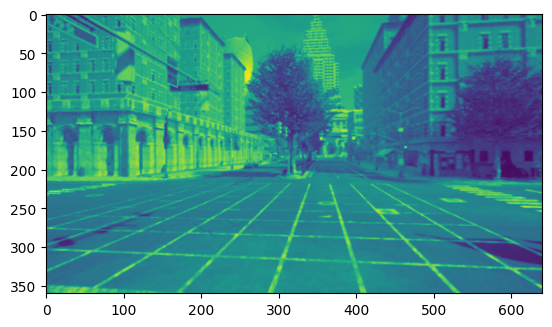

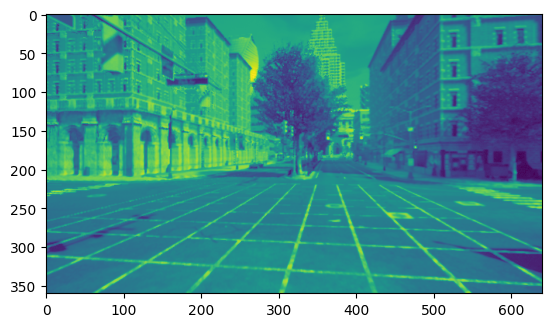

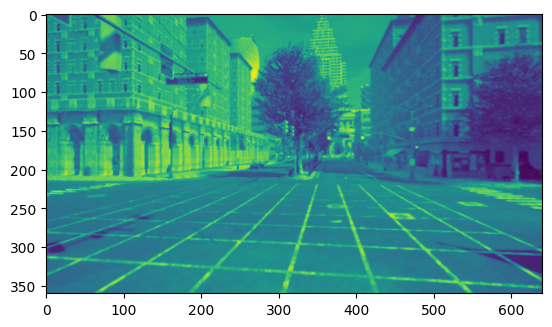

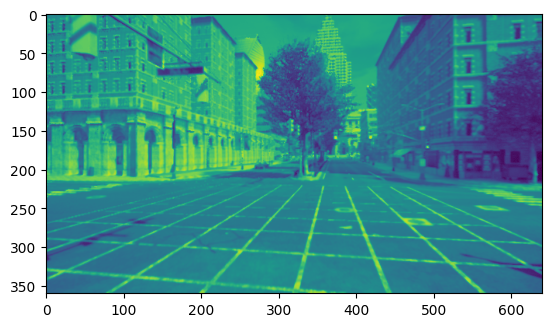

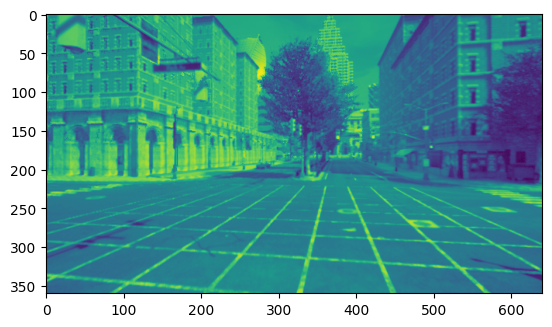

...

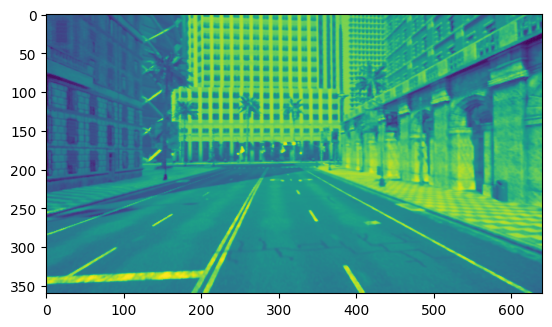

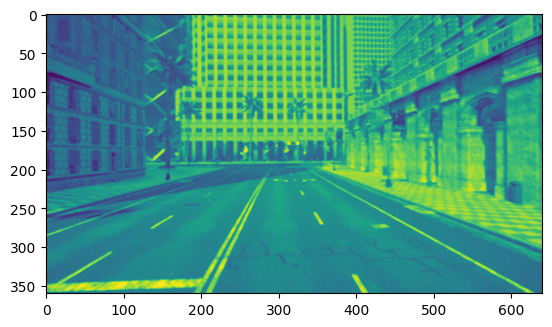

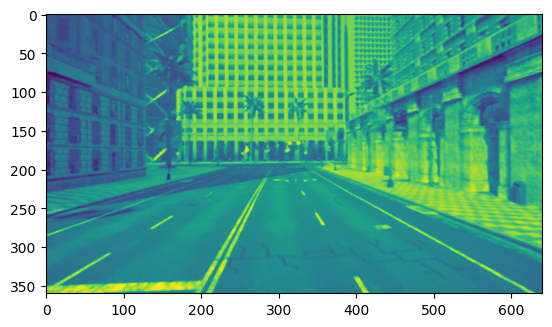

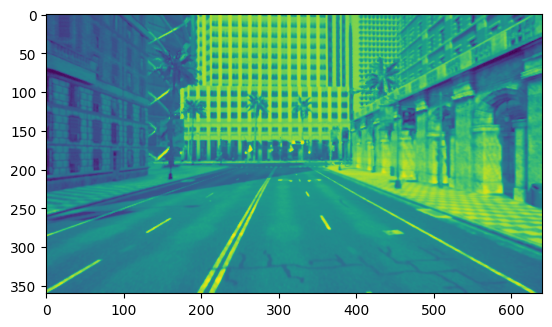

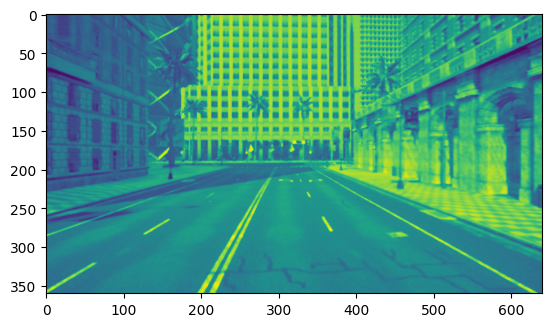

In [25]:
#cv2.namedWindow('RGB Camera', cv2.WINDOW_AUTOSIZE)
#cv2.imshow('RGB Camera', camera_data['image'])

quit = False
threshold_low = 10
threshold_high = 200
while True:
    world.tick()
    if cv2.waitKey(1) == ord('q'):
        quit = True
        break
    image = camera_data['image']
    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    #image_canny = cv2.Canny(gray_image, threshold_low, threshold_high)
    #lane_detection_image = np.copy(gray_image)
    #lane_detection_image[(lane_detection_image[:,:] < 250)] = 0
    #plt.figure()
    #plt.imshow(gray_image)
    cv2.imshow('Canny camera', image_canny)

cv2.destroyAllWindows()
camera.stop()
for actor in world.get_actors().filter('*vehicle*'):
    actor.destroy()
for sensor in world.get_actors().filter('*sensor*'):
    sensor.destroy()

In [6]:
#cv2.namedWindow('RGB Camera', cv2.WINDOW_AUTOSIZE)
#cv2.imshow('RGB Camera', camera_data['image'])

quit = False
threshold_low = 10
threshold_high = 200
rho = 2            # distance resolution in pixels 
theta = np.pi/180  # angular resolution in radians 
threshold = 40     # minimum number of votes 
min_line_len = 100  # minimum number of pixels making up a line
max_line_gap = 50  # maximum gap in pixels between connectable line segments
α = 1
β = 1
γ = 0    

while True:
    world.tick()
    if cv2.waitKey(1) == ord('q'):
        quit = True
        break
    image = camera_data['image']
    image_2 = camera_data_2['image']
    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    mask = np.zeros_like(gray_image)
    cv2.fillPoly(mask, vertices, 255)
    image_canny = cv2.Canny(gray_image, threshold_low, threshold_high)
    masked_image = cv2.bitwise_and(image_canny, mask)
    # Camera 2
    
    gray_image_2 = cv2.cvtColor(image_2, cv2.COLOR_BGR2GRAY)
    mask_2 = np.zeros_like(gray_image_2)
    cv2.fillPoly(mask_2, vertices, 255)
    image_canny_2 = cv2.Canny(gray_image_2, threshold_low, threshold_high)
    masked_image_2 = cv2.bitwise_and(image_canny_2, mask)
    
    lines = cv2.HoughLinesP(masked_image, rho, theta, threshold, np.array([]), minLineLength=min_line_len, maxLineGap=max_line_gap)
    #line_image = np.zeros((masked_image.shape[0], masked_image.shape[1], 3), dtype=np.uint8)
    if lines is not None:
        for line in lines:
            for x1, y1, x2, y2 in line:      
                cv2.line(line_image, (x1, y1), (x2, y2), [255, 0, 0], 20)
                
    #print(lines)
            
    Image_with_lines = cv2.addWeighted(image, α, line_image, β, γ)
    cv2.imshow('ROI camera', masked_image)
    cv2.imshow('Camera 2', image_2)

cv2.destroyAllWindows()
camera.stop()
for actor in world.get_actors().filter('*vehicle*'):
    actor.destroy()
for sensor in world.get_actors().filter('*sensor*'):
    sensor.destroy()

NameError: name 'line_image' is not defined

In [58]:
# Script for destrucction

for actor in world.get_actors().filter('*vehicle*'):
    actor.destroy()
for actor in world.get_actors().filter('*sensor*'):
    actor.destroy()